# Wheel velocity across learning timepoints

For each mouse, pick sessions at configurable learning timepoints (quartiles over
`session_date`), then extract and bin the **wheel velocity** (`avg_wheel_vel`) per
trial type and trial phase. No HMM states are used here.

Outputs one file per timepoint.

In [1]:
"""
IMPORTS
"""
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from one.api import ONE
import sys

sys.path.append(os.path.abspath(
    os.path.join(os.getcwd(), "..", "segmentation", "1_camera_setup")))

from segmentation_functions import (
    align_bin_design_matrix, states_per_trial_phase, broader_label,
    define_trial_types, rescale_sequence, process_design_matrix,
)

# # All helper functions now live in segmentation_functions for this folder
# from segmentation_functions import (
#     align_bin_design_matrix,
#     states_per_trial_phase,
#     broader_label,
#     define_trial_types,
#     rescale_sequence,
#     process_design_matrix,
# )

one = ONE(mode='remote')

## Parameters

In [9]:
# --- Paths (adjust to your machine) ---
prefix = "/home/ines/repositories/"

# Design matrices (contain `avg_wheel_vel`) and per-session trials tables
data_path = '/home/ines/repositories/representation_learning_variability/paper-individuality/data/design_matrices/1_camera_setup/session_1_individuality/wheel/' # data should be moved to the drive manually
data_path = prefix + 'representation_learning_variability/paper-individuality/data/design_matrices/1_camera_setup/session_1/wheel/' # data should be moved to the drive manually

# Per-mouse learning tables that carry `session` (eid) and `session_date`
learning_data_path = prefix + "representation_learning_variability/paper-individuality/data/training/training_data/"

# Where to write outputs
results_path = prefix + "representation_learning_variability/paper-individuality/learning_individuality/"
os.makedirs(results_path, exist_ok=True)

# --- Learning timepoints (fractional position within each mouse's sorted sessions) ---
# Edit freely: e.g. [0.0, 0.5, 1.0] for first/middle/last only.
timepoint_fracs = [0.0, 0.25, 0.5, 0.75, 1.0]
timepoint_names = ["first", "q25", "middle", "q75", "last"]
timepoint_fracs = [0.0, 0.5, 1.0]
timepoint_names = ["first", "middle", "last"]
timepoint_fracs = [0.0, 1.0]
timepoint_names = ["first", "last"]
assert len(timepoint_fracs) == len(timepoint_names)

# --- Trial-type / binning parameters ---
trial_type_agg = ["correct_str", "contrast_str", "block_str", "choice"]
target_length = 10          # fixed length each velocity sequence is rescaled to
estimator = "mean"          # continuous velocity -> mean per bin

# --- Trial alignment window (aligned on go cue) ---
multiplier = 1
event_type_list = ["goCueTrigger_times"]
init = -1.0 * multiplier
end = 1.5 * multiplier

# Tag added to output filenames so runs are traceable
run_tag = "wheel_vel"

## 1. Identify mice of interest

In [10]:
clustering_path = prefix + 'representation_learning_variability/paper-individuality/clustering/'
lda = pd.read_pickle(clustering_path + 'mouse_LDA_5_bins_cut19-06-2026')
lda = lda.rename(columns={0: 'lda_1'})
lda = lda.loc[lda['mouse_name']!='PL034']

lda_mice = lda['mouse_name'].unique()
mouse_lda = lda.groupby('mouse_name')['lda_1'].mean().reset_index()   # mean LDA 1 per mouse
print(f'{len(lda_mice)} LDA mice')

55 LDA mice


In [11]:
# lda_mice.sort()
# lda_mice = lda_mice[:23]

## 2. Select sessions at learning timepoints
Per mouse: order available sessions by `session_date`, then pick one session at each fractional position.

In [12]:
# Design matrices already generated on disk (used only for the availability flag)
available_by_mouse = {}
for f in os.listdir(data_path):
    if "design_matrix" in f and "standardized" not in f:
        rest = f[len("design_matrix_"):]
        available_by_mouse.setdefault(rest[37:], set()).add(rest[:36])


def select_timepoint_sessions(mice, learning_data_path, available_by_mouse, fracs, names):
    """One session per (mouse, timepoint), chosen by ORDINAL position in the
    mouse's full training history. The cohort is the explicit `mice` list;
    `has_design_matrix` flags whether the chosen eid already exists on disk."""
    rows = []
    for mouse_name in sorted(mice):
        f = os.path.join(learning_data_path, "training_data_trials_" + mouse_name)
        if not os.path.exists(f):
            print(f"  [skip] no learning table for {mouse_name}")
            continue

        td = pd.read_parquet(f)
        td["session_date"] = pd.to_datetime(td["session_date"])

        # Full chronological order of ALL this mouse's training sessions
        order = (td[["session", "session_date"]]
                 .dropna().drop_duplicates()
                 .sort_values("session_date")
                 .reset_index(drop=True))
        n = len(order)
        if n == 0:
            print(f"  [skip] {mouse_name}: no sessions in learning table")
            continue
        order["session_number"] = np.arange(1, n + 1)  # 1..n ordinal

        available = available_by_mouse.get(mouse_name, set())
        for frac, name in zip(fracs, names):
            idx = int(round(frac * (n - 1)))
            r = order.iloc[idx]
            rows.append({
                "mouse_name": mouse_name,
                "session": r["session"],
                "timepoint": name,
                "session_number": int(r["session_number"]),
                "n_sessions": n,
                "session_date": r["session_date"],
                "has_design_matrix": r["session"] in available,
            })

    return pd.DataFrame(rows)


selected = select_timepoint_sessions(lda_mice, learning_data_path,
                                     available_by_mouse, timepoint_fracs, timepoint_names)

# Warn where a mouse has too few sessions and timepoints collapse to one session
collapsed = (selected.groupby("mouse_name")["session"].nunique()
             < selected.groupby("mouse_name")["timepoint"].nunique())
if collapsed.any():
    print("Mice where timepoints share a session (few sessions):",
          list(collapsed[collapsed].index))

n_missing = int((~selected["has_design_matrix"]).sum())
print(f"Selected {len(selected)} (mouse, timepoint) rows "
      f"across {selected['mouse_name'].nunique()} mice; "
      f"{n_missing} still lack a design matrix.")
selected.head()

Selected 110 (mouse, timepoint) rows across 55 mice; 0 still lack a design matrix.


,mouse_name,session,timepoint,session_number,n_sessions,session_date,has_design_matrix
0,CSHL045,b117ed10-6871-42b3-9193-ca708dac4353,first,1,45,2019-11-04,True
1,CSHL045,047b4a9b-1a61-41a6-b868-1ce0fccc77c7,last,45,45,2020-01-15,True
2,CSHL049,7331502c-ac8b-4d1c-ae35-b384e95088f4,first,1,15,2019-11-04,True
3,CSHL049,8c870406-c984-4896-8162-7d7ab7478b6c,last,15,15,2019-11-25,True
4,CSHL052,dc990d49-4e51-4759-992b-292fbe22a7eb,first,1,48,2019-11-12,True


### Sanity check: selected sessions
Each mouse's picked sessions on a date axis — `first` should sit left of `middle` left of `last`.

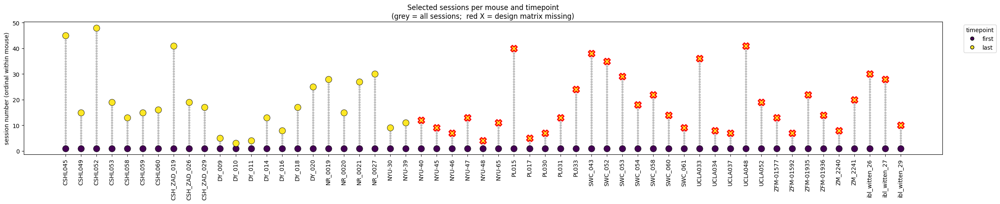

timepoint      first  last
mouse_name                
CSHL045            1    45
CSHL049            1    15
CSHL052            1    48
CSHL053            1    19
CSHL058            1    13
CSHL059            1    15
CSHL060            1    16
CSH_ZAD_019        1    41
CSH_ZAD_026        1    19
CSH_ZAD_029        1    17
DY_009             1     5
DY_010             1     3
DY_011             1     4
DY_014             1    13
DY_016             1     8
DY_018             1    17
DY_020             1    25
NR_0019            1    28
NR_0020            1    15
NR_0021            1    27
NR_0027            1    30
NYU-30             1     9
NYU-39             1    11
NYU-40             1    12
NYU-45             1     9
NYU-46             1     7
NYU-47             1    13
NYU-48             1     4
NYU-65             1    11
PL015              1    40
PL017              1     5
PL030              1     7
PL031              1    13
PL033              1    24
SWC_043            1    38
S

In [28]:
tp_palette = dict(zip(timepoint_names,
                      plt.cm.viridis(np.linspace(0, 1, len(timepoint_names)))))

mice = sorted(selected["mouse_name"].unique())
fig, ax = plt.subplots(figsize=(0.4 * len(mice) + 2, 5))
for x, mouse in enumerate(mice):
    sub = selected[selected["mouse_name"] == mouse]
    n = int(sub["n_sessions"].iloc[0])
    # full training range for context (vertical line per mouse)
    ax.plot([x] * n, range(1, n + 1), "-", color="0.85", zorder=1)
    ax.scatter([x] * n, range(1, n + 1), s=8, color="0.75", zorder=2)
    # selected timepoints
    for _, r in sub.iterrows():
        ok = bool(r["has_design_matrix"])
        ax.scatter(x, r["session_number"], s=120,
                   color=tp_palette[r["timepoint"]],
                   edgecolor=("k" if ok else "red"),
                   linewidth=(0.6 if ok else 2.0),
                   marker=("o" if ok else "X"), zorder=3)
ax.set_xticks(range(len(mice)))
ax.set_xticklabels(mice, rotation=90)
ax.set_ylabel("session number (ordinal within mouse)")
ax.set_title("Selected sessions per mouse and timepoint\n"
             "(grey = all sessions;  red X = design matrix missing)")
handles = [plt.Line2D([0], [0], marker="o", ls="", color=tp_palette[t],
                      markeredgecolor="k", label=t) for t in timepoint_names]
ax.legend(handles=handles, title="timepoint",
          bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ordinal position of each pick (should increase first -> middle -> last)
print(selected.pivot_table(index="mouse_name", columns="timepoint",
                           values="session_number", aggfunc="first")
      [[t for t in timepoint_names if t in selected["timepoint"].unique()]])

## 2b. Availability of selected sessions
Which selected eids still need a wheel design matrix.

In [13]:
missing = selected.loc[~selected["has_design_matrix"],
                       ["mouse_name", "timepoint", "session_number", "session"]]
if len(missing):
    print(f"{len(missing)} selected sessions lack a design matrix:")
    for _, r in missing.iterrows():
        print(f"  {r['mouse_name']}  {r['timepoint']:>6}  "
              f"session #{r['session_number']}  {r['session']}")
    missing_eids = missing["session"].tolist()
else:
    missing_eids = []
    print("All selected sessions already have a design matrix.")

All selected sessions already have a design matrix.


## 2c. Generate missing design matrices
Run the wheel design-matrix machinery on exactly the missing eids (`process_design_matrix`, now in `segmentation_functions`). This uses ONE and downloads data, so it is opt-in. Re-run 2b afterwards.

In [14]:
# Set to True to generate the missing design matrices (ONE downloads data).
GENERATE_MISSING = True

if GENERATE_MISSING and len(missing_eids):
    for eid in missing_eids:
        print(f"Processing {eid} ...")
        process_design_matrix(eid, one, data_path)

    # Refresh availability after generation
    available_by_mouse = {}
    for f in os.listdir(data_path):
        if "design_matrix" in f and "standardized" not in f:
            rest = f[len("design_matrix_"):]
            available_by_mouse.setdefault(rest[37:], set()).add(rest[:36])
    selected["has_design_matrix"] = selected.apply(
        lambda r: r["session"] in available_by_mouse.get(r["mouse_name"], set()),
        axis=1)
    print("Done. Still missing:", int((~selected["has_design_matrix"]).sum()))
else:
    print("Skipped (set GENERATE_MISSING=True to run).")

Skipped (set GENERATE_MISSING=True to run).


## 2d. Guard
Stop before step 3 unless every selected session has a design matrix.

In [15]:
still_missing = selected.loc[~selected["has_design_matrix"], "session"].tolist()
if still_missing:
    raise RuntimeError(
        f"{len(still_missing)} selected sessions still lack a design matrix. "
        f"Generate them (cell 2c with GENERATE_MISSING=True, or run 2.1.2_design_matrix_wheel), "
        f"then re-run. Missing eids: {still_missing}")
print("All selected sessions have design matrices; safe to proceed.")

All selected sessions have design matrices; safe to proceed.


## 3. Extract wheel velocity per trial phase
For each selected session, align the design matrix to the go cue and label every bin
with its trial phase and trial-type metadata. Saved as one combined file per timepoint.

In [ ]:
keep_cols = ["Bin", "avg_wheel_vel",
             "correct", "choice", "contrast", "block", "reaction", "response",
             "elongation", "wsls", "trial_id", "goCueTrigger_times",
             "label", "broader_label", "mouse_name", "session", "timepoint"]


def process_session_velocity(mouse_name, session, timepoint):
    dm_file = os.path.join(data_path, f"design_matrix_{session}_{mouse_name}")
    trials_file = os.path.join(data_path, f"session_trials_{session}_{mouse_name}")
    for f in (dm_file, trials_file):
        if not os.path.exists(f):
            raise FileNotFoundError(
                f"Missing required file for {mouse_name} {timepoint} ({session}): {f}")

    design_matrix = pd.read_parquet(dm_file)[["Bin", "avg_wheel_vel"]].copy()
    session_trials = pd.read_parquet(trials_file, engine="pyarrow").reset_index()

    # align_bin_design_matrix takes a `most_likely_states` arg we don't need here;
    # pass a placeholder of matching length (it is dropped downstream).
    placeholder = np.zeros(len(design_matrix))
    aligned = align_bin_design_matrix(init, end, event_type_list,
                                      session_trials, design_matrix,
                                      placeholder, multiplier)
    aligned = aligned.drop(columns=["new_bin", "most_likely_states"])

    per_trial = states_per_trial_phase(aligned, session_trials, multiplier)
    per_trial = broader_label(per_trial)
    per_trial["mouse_name"] = mouse_name
    per_trial["session"] = session
    per_trial["timepoint"] = timepoint
    return per_trial[keep_cols]


for timepoint in timepoint_names:
    tp_rows = selected.loc[selected["timepoint"] == timepoint]
    if len(tp_rows) == 0:
        continue

    # No try/except: a missing / broken session raises instead of being skipped
    combined = [process_session_velocity(r["mouse_name"], r["session"], timepoint)
                for _, r in tp_rows.iterrows()]

    tp_states = pd.concat(combined, ignore_index=True)
    out = os.path.join(results_path, f"{run_tag}_states_{timepoint}")
    tp_states.to_parquet(out, compression="gzip")
    print(f"{timepoint}: {tp_states['session'].nunique()} sessions -> {out}")

/home/ines/repositories/representation_learning_variability/paper-individuality/segmentation/1_camera_setup/segmentation_functions.py:1030: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  trials['prev_choice'][1:] = trials['choice'][:-1]
/home

### Sanity check: wheel speed per trial phase
Mean |wheel velocity| per phase — expect low speed in Quiescence, high around Choice.

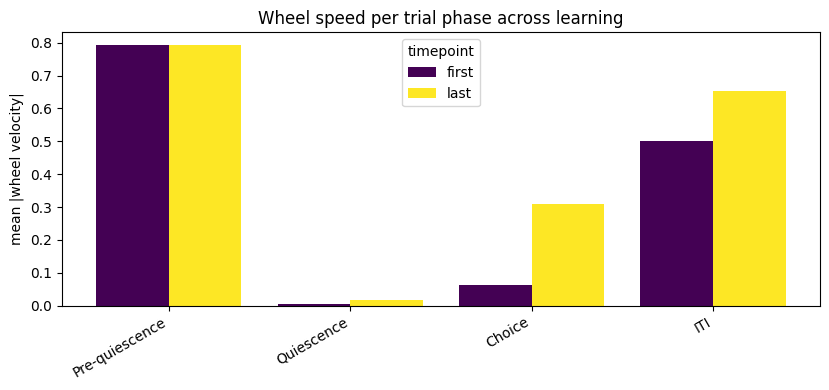

In [33]:
phase_order = ["Pre-quiescence", "Quiescence", "Choice", "ITI"]
tp_palette = dict(zip(timepoint_names,
                      plt.cm.viridis(np.linspace(0, 1, len(timepoint_names)))))

frames = []
for tp in timepoint_names:
    f = os.path.join(results_path, f"{run_tag}_states_{tp}")
    if os.path.exists(f):
        d = pd.read_parquet(f)
        d["timepoint"] = tp
        frames.append(d)
allst = pd.concat(frames, ignore_index=True)
allst["speed"] = allst["avg_wheel_vel"].abs()

summary = (allst.dropna(subset=["broader_label"])
           .groupby(["timepoint", "broader_label"])["speed"].mean().reset_index())
phases = [p for p in phase_order if p in summary["broader_label"].unique()]
phases += [p for p in summary["broader_label"].unique() if p not in phases]

fig, ax = plt.subplots(figsize=(1.6 * len(phases) + 2, 4))
width = 0.8 / max(len(timepoint_names), 1)
x = np.arange(len(phases))
for i, tp in enumerate(timepoint_names):
    vals = [summary.loc[(summary["timepoint"] == tp) &
                        (summary["broader_label"] == p), "speed"].mean()
            for p in phases]
    ax.bar(x + i * width, vals, width, label=tp, color=tp_palette[tp])
ax.set_xticks(x + width * (len(timepoint_names) - 1) / 2)
ax.set_xticklabels(phases, rotation=30, ha="right")
ax.set_ylabel("mean |wheel velocity|")
ax.set_title("Wheel speed per trial phase across learning")
ax.legend(title="timepoint")
plt.tight_layout()
plt.show()

## 4. Bin wheel-velocity sequences per trial type
Per timepoint: define trial types, group velocity by (sample, trial type, trial phase),
and rescale each sequence of |avg_wheel_vel| to a fixed length. One file per timepoint.

In [34]:
group_vars = ["sample", "trial_type", "broader_label", "mouse_name"]


def bin_velocity_sequences(tp_states, trial_type_agg, target_length, estimator):
    states_df = define_trial_types(tp_states, trial_type_agg)

    # Use absolute velocity (speed); drop bins without a velocity value
    states_df = states_df.dropna(subset=["avg_wheel_vel"]).copy()
    states_df["avg_wheel_vel"] = np.abs(states_df["avg_wheel_vel"])

    grouped = (states_df.groupby(group_vars)["avg_wheel_vel"]
               .apply(list).reset_index()
               .rename(columns={"avg_wheel_vel": "avg_wheel_vel_sequence"}))
    grouped["avg_wheel_vel_binned_sequence"] = grouped["avg_wheel_vel_sequence"].apply(
        lambda seq: rescale_sequence(seq, target_length, estimator))
    return grouped


for timepoint in timepoint_names:
    in_file = os.path.join(results_path, f"{run_tag}_states_{timepoint}")
    if not os.path.exists(in_file):
        continue

    tp_states = pd.read_parquet(in_file)
    sequences = bin_velocity_sequences(tp_states, trial_type_agg,
                                       target_length, estimator)
    out = os.path.join(results_path, f"{run_tag}_cont_sequences_{timepoint}")
    sequences.to_parquet(out)
    print(f"{timepoint}: {len(sequences)} sequences -> {out}")

/home/ines/repositories/representation_learning_variability/paper-individuality/segmentation/1_camera_setup/segmentation_functions.py:1335: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'correct' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  states_trial_type.loc[states_trial_type['correct_str']==1., 'correct_str'] = 'correct'


first: 63110 sequences -> /home/ines/repositories/representation_learning_variability/paper-individuality/learning_individuality/wheel_vel_cont_sequences_first


/home/ines/repositories/representation_learning_variability/paper-individuality/segmentation/1_camera_setup/segmentation_functions.py:1335: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'correct' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  states_trial_type.loc[states_trial_type['correct_str']==1., 'correct_str'] = 'correct'


last: 161159 sequences -> /home/ines/repositories/representation_learning_variability/paper-individuality/learning_individuality/wheel_vel_cont_sequences_last


### Sanity check: velocity time-course within each phase
Average length-`target_length` sequence per phase, one line per timepoint.

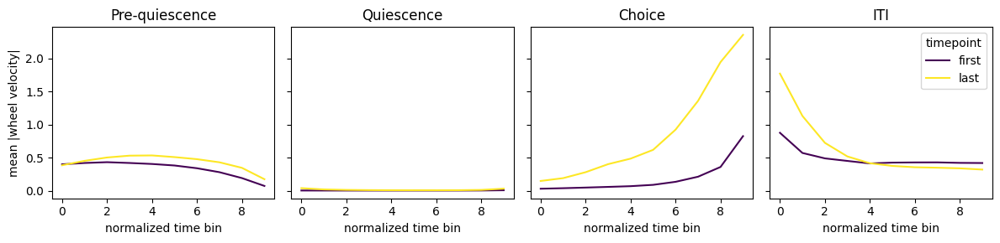

In [35]:
phase_order = ["Pre-quiescence", "Quiescence", "Choice", "ITI"]
tp_palette = dict(zip(timepoint_names,
                      plt.cm.viridis(np.linspace(0, 1, len(timepoint_names)))))

frames = []
for tp in timepoint_names:
    f = os.path.join(results_path, f"{run_tag}_cont_sequences_{tp}")
    if os.path.exists(f):
        d = pd.read_parquet(f)
        d["timepoint"] = tp
        frames.append(d)
seqs = pd.concat(frames, ignore_index=True)

phases = [p for p in phase_order if p in seqs["broader_label"].unique()]
phases += [p for p in seqs["broader_label"].unique() if p not in phases]

fig, axs = plt.subplots(1, len(phases), figsize=(3 * len(phases), 3), sharey=True)
axs = np.atleast_1d(axs)
for ax, ph in zip(axs, phases):
    for tp in timepoint_names:
        sub = seqs[(seqs["broader_label"] == ph) & (seqs["timepoint"] == tp)]
        if len(sub) == 0:
            continue
        M = np.vstack([np.asarray(s, dtype=float)
                       for s in sub["avg_wheel_vel_binned_sequence"]])
        ax.plot(np.nanmean(M, axis=0), label=tp, color=tp_palette[tp])
    ax.set_title(ph)
    ax.set_xlabel("normalized time bin")
axs[0].set_ylabel("mean |wheel velocity|")
axs[-1].legend(title="timepoint")
plt.tight_layout()
plt.show()

## 5. Wheel velocity vs LDA 1 across timepoints
Replicates the `session_1_analyses` correlation analysis, separately per learning
timepoint. For each trial the per-phase binned velocity sequences are concatenated
into one vector (`target_length` x n phases), averaged per mouse, then correlated
against each mouse's mean LDA 1 at every timestep (with a shuffle null).

In [36]:
from scipy.stats import pearsonr

epochs = ["Pre-quiescence", "Quiescence", "Choice", "ITI"]  # concatenation order
seq_col = "avg_wheel_vel_binned_sequence"
n_perm = 500
np.random.seed(0)  # reproducible permutation null


def timepoint_velocity_matrix(sequences, seq_col, epochs):
    """Concatenate per-phase binned sequences into one |velocity| vector per trial.
    Returns a DataFrame with numeric columns 0..L-1 plus `mouse_name`."""
    s = sequences.copy()
    s["session"] = s["sample"].str[:36]
    design = (s.pivot(index=["sample", "trial_type", "mouse_name", "session"],
                      columns="broader_label", values=seq_col)
              .reset_index())
    design = design.dropna(subset=epochs)  # keep trials that have every phase
    mat = np.vstack(design[epochs].apply(
        lambda row: np.hstack([np.asarray(x, dtype=float) for x in row]), axis=1))
    mat = np.abs(mat)
    out = pd.DataFrame(mat)
    out["mouse_name"] = design["mouse_name"].values
    return out


def lda_correlation_per_timestep(mat_df, mouse_lda, n_perm):
    """Across-mouse Pearson r between mean LDA 1 and mean velocity at each timestep,
    plus a label-shuffle permutation null."""
    L = mat_df.shape[1] - 1
    df = mat_df.merge(mouse_lda[["mouse_name", "lda_1"]], on="mouse_name")
    per_mouse = (df.groupby(["mouse_name", "lda_1"])[list(range(L))]
                 .mean().reset_index())
    lda = per_mouse["lda_1"].to_numpy()
    vel = per_mouse[list(range(L))].to_numpy()          # (n_mice, L)
    coeffs = np.array([pearsonr(lda, vel[:, i])[0] for i in range(L)])

    perm = np.full((n_perm, L), np.nan)
    shuf = lda.copy()
    for k in range(n_perm):
        np.random.shuffle(shuf)
        perm[k] = [pearsonr(shuf, vel[:, i])[0] for i in range(L)]
    return {"coeffs": coeffs, "perm_mean": perm.mean(0), "perm_std": perm.std(0),
            "L": L, "n_mice": len(per_mouse)}


# Compute per timepoint
mats, corr = {}, {}
for tp in timepoint_names:
    f = os.path.join(results_path, f"{run_tag}_cont_sequences_{tp}")
    if not os.path.exists(f):
        continue
    seqs = pd.read_parquet(f)
    mats[tp] = timepoint_velocity_matrix(seqs, seq_col, epochs)
    corr[tp] = lda_correlation_per_timestep(mats[tp], mouse_lda, n_perm)
    print(f"{tp}: {corr[tp]['n_mice']} mice, sequence length {corr[tp]['L']}")

# Phase boundaries / centered labels for the concatenated x-axis
seq_len = corr[timepoint_names[0]]["L"] // len(epochs) if corr else target_length
boundaries = [seq_len * k for k in range(1, len(epochs))]
centers = [seq_len * k + seq_len / 2 for k in range(len(epochs))]

first: 55 mice, sequence length 40
last: 55 mice, sequence length 40


### Correlation per timestep, faceted by timepoint

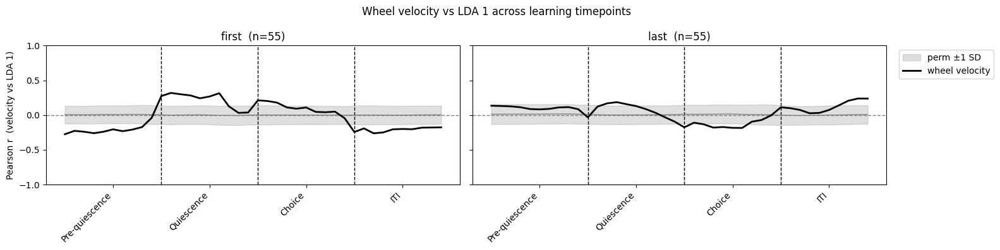

In [37]:
tps = [t for t in timepoint_names if t in corr]
fig, axs = plt.subplots(1, len(tps), figsize=(8 * len(tps), 4),
                        sharey=True, squeeze=False)
axs = axs[0]
time_axis = np.arange(corr[tps[0]]["L"])
for ax, tp in zip(axs, tps):
    r = corr[tp]
    ax.axhline(0, color="grey", ls="--", lw=1)
    for b in boundaries:
        ax.axvline(b, color="k", ls="--", lw=1)
    ax.fill_between(time_axis, r["perm_mean"] - r["perm_std"],
                    r["perm_mean"] + r["perm_std"], color="grey", alpha=0.25,
                    label="perm ±1 SD")
    ax.plot(time_axis, r["perm_mean"], color="grey", lw=1)
    ax.plot(time_axis, r["coeffs"], color="black", lw=2, label="wheel velocity")
    ax.set_ylim([-1, 1])
    ax.set_title(f"{tp}  (n={r['n_mice']})")
    ax.set_xticks(centers)
    ax.set_xticklabels(epochs, rotation=45, ha="right")
axs[0].set_ylabel("Pearson r  (velocity vs LDA 1)")
axs[-1].legend(bbox_to_anchor=(1.02, 1), loc="upper left")
fig.suptitle("Wheel velocity vs LDA 1 across learning timepoints")
plt.tight_layout()
plt.show()

### Correlation curves overlaid across timepoints

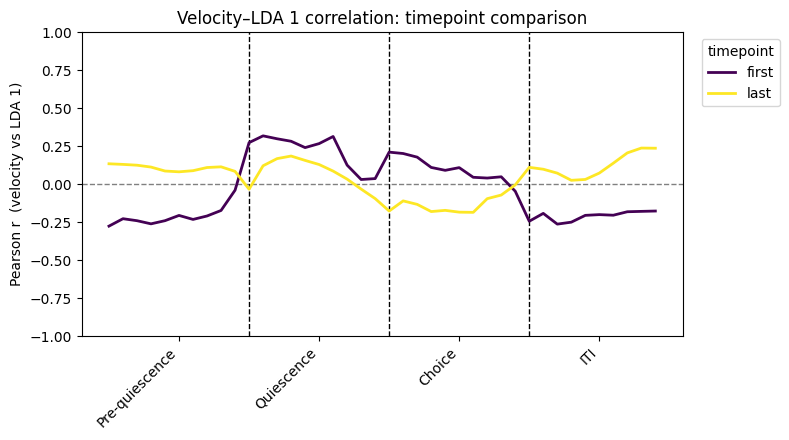

In [38]:
tp_palette = dict(zip(timepoint_names,
                      plt.cm.viridis(np.linspace(0, 1, len(timepoint_names)))))
fig, ax = plt.subplots(figsize=(8, 4.5))
ax.axhline(0, color="grey", ls="--", lw=1)
for b in boundaries:
    ax.axvline(b, color="k", ls="--", lw=1)
for tp in tps:
    ax.plot(np.arange(corr[tp]["L"]), corr[tp]["coeffs"],
            color=tp_palette[tp], lw=2, label=tp)
ax.set_ylim([-1, 1])
ax.set_xticks(centers)
ax.set_xticklabels(epochs, rotation=45, ha="right")
ax.set_ylabel("Pearson r  (velocity vs LDA 1)")
ax.set_title("Velocity–LDA 1 correlation: timepoint comparison")
ax.legend(title="timepoint", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()

### Wheel velocity profile by LDA-1 bin (per timepoint)
Companion to `session_1_analyses` cell 27: mean velocity trace, mice split into 5 LDA-1 bins.

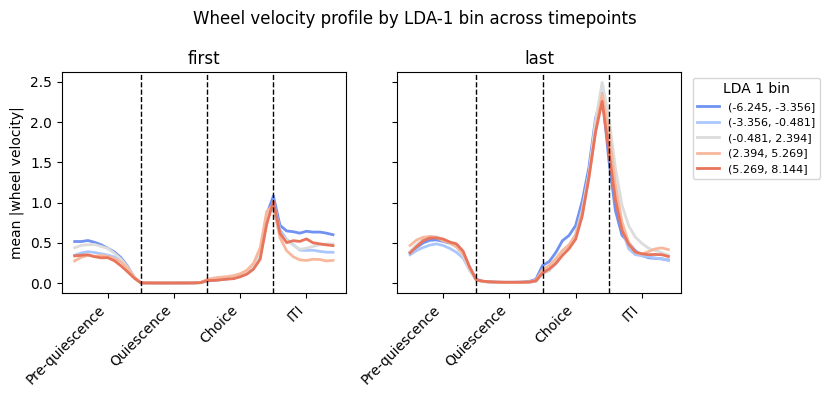

In [39]:
n_bins = 5
lda_binned = mouse_lda.copy()
lda_binned["lda_1_bin"] = pd.cut(lda_binned["lda_1"], n_bins)
bin_levels = lda_binned["lda_1_bin"].cat.categories
bin_palette = sns.color_palette("coolwarm", n_bins)

fig, axs = plt.subplots(1, len(tps), figsize=(4.2 * len(tps), 4),
                        sharey=True, squeeze=False)
axs = axs[0]
for ax, tp in zip(axs, tps):
    L = corr[tp]["L"]
    df = mats[tp].merge(lda_binned[["mouse_name", "lda_1_bin"]], on="mouse_name")
    for bi, level in enumerate(bin_levels):
        sub = df.loc[df["lda_1_bin"] == level, list(range(L))]
        if len(sub) == 0:
            continue
        ax.plot(np.arange(L), sub.to_numpy().mean(axis=0),
                color=bin_palette[bi], lw=2, label=str(level))
    for b in boundaries:
        ax.axvline(b, color="k", ls="--", lw=1)
    ax.set_title(tp)
    ax.set_xticks(centers)
    ax.set_xticklabels(epochs, rotation=45, ha="right")
axs[0].set_ylabel("mean |wheel velocity|")
axs[-1].legend(title="LDA 1 bin", bbox_to_anchor=(1.02, 1), loc="upper left",
               fontsize=8)
fig.suptitle("Wheel velocity profile by LDA-1 bin across timepoints")
plt.tight_layout()
plt.show()

## Trait persistence: is the session-1 profile a (scaled) version of the proficiency one?

Same test as in `whisk_state_timepoints`, for continuous |wheel velocity|. Asks whether the
proficiency wheel-velocity–vs–LDA1 relationship is already present on session 1.
- **Projection test (significance):** weight each mouse's session-1 velocity profile by the
  proficiency template and correlate with LDA1; shuffle-LDA1 null.
- **Regression slope (effect size):** regress `r_early(bin)` on `r_prof(bin)`; β>0 ⇒ present,
  β≈1 ⇒ preserved, 0<β<1 ⇒ attenuated.

Wheel isn't in the LDA pipeline, so provide the proficiency profile as a **proficiency wheel
`*_cont_sequences_*`** file (same pipeline, proficient sessions) — `r_prof` is computed from it.

In [ ]:
from scipy.stats import pearsonr
dim_col = "lda_1"


def _per_mouse(mat_df, mouse_lda, dim_col):
    L = mat_df.shape[1] - 1
    df = mat_df.merge(mouse_lda[["mouse_name", dim_col]], on="mouse_name")
    pm = df.groupby(["mouse_name", dim_col])[list(range(L))].mean().reset_index()
    return pm[dim_col].to_numpy(float), pm[list(range(L))].to_numpy(float)


def profile_coeffs(mat_df, mouse_lda, dim_col):
    lv, Y = _per_mouse(mat_df, mouse_lda, dim_col)
    return np.array([pearsonr(lv, Y[:, i])[0] for i in range(Y.shape[1])])


def trait_persistence(early_mat, r_prof, mouse_lda, dim_col, bins=None, n_perm=5000, seed=0):
    """Projection test + regression slope vs a shuffle-LDA-across-mice null.
    `bins`=None uses the whole trial; pass an index array to restrict to one epoch."""
    rng = np.random.default_rng(seed)
    lda_vals, Y = _per_mouse(early_mat, mouse_lda, dim_col)
    Z = (Y - Y.mean(0)) / (Y.std(0) + 1e-12)
    bins = np.arange(Y.shape[1]) if bins is None else np.asarray(bins)
    rp = np.asarray(r_prof, float)[bins]
    w = rp / (np.linalg.norm(rp) + 1e-12)
    score = Z[:, bins] @ w
    r_proj = pearsonr(score, lda_vals)[0]
    r_early = np.array([pearsonr(lda_vals, Y[:, b])[0] for b in bins])
    fin = np.isfinite(rp) & np.isfinite(r_early)
    slope, intercept = np.polyfit(rp[fin], r_early[fin], 1) if fin.sum() >= 2 else (np.nan, np.nan)
    r_shape = pearsonr(rp[fin], r_early[fin])[0] if fin.sum() >= 2 else np.nan
    npj = np.empty(n_perm); nsl = np.empty(n_perm)
    for k in range(n_perm):
        p = rng.permutation(lda_vals)
        npj[k] = pearsonr(score, p)[0]
        re = np.array([pearsonr(p, Y[:, b])[0] for b in bins])
        nsl[k] = np.polyfit(rp[fin], re[fin], 1)[0] if fin.sum() >= 2 else np.nan
    return dict(r_proj=r_proj, p_proj=(1 + np.sum(npj >= r_proj)) / (n_perm + 1),
                slope=slope, intercept=intercept,
                p_slope=(1 + np.nansum(nsl >= slope)) / (n_perm + 1),
                r_shape=r_shape, r_early=r_early, score=score, lda=lda_vals, n=len(lda_vals))


# ---- proficiency profile (trait template) ----
proficiency_seq_file = ""   # FILL: a wheel *_cont_sequences_* from PROFICIENT sessions
prof_mat = timepoint_velocity_matrix(pd.read_parquet(proficiency_seq_file), seq_col, epochs)
r_prof = profile_coeffs(prof_mat, mouse_lda, dim_col)
assert len(r_prof) == mats[timepoint_names[0]].shape[1] - 1, \
    "proficiency profile length != session-1 bin count (check epoch/bin layout)"
print(f"proficiency wheel profile: L={len(r_prof)}, r in [{np.nanmin(r_prof):+.2f}, {np.nanmax(r_prof):+.2f}]")

In [ ]:
tp = timepoint_names[0]
res = trait_persistence(mats[tp], r_prof, mouse_lda, dim_col, n_perm=n_perm)
print(f"[wheel velocity, LDA 1, n={res['n']} mice]")
print(f"  Projection : r(score, LDA1) = {res['r_proj']:+.3f}   p = {res['p_proj']:.4f}")
print(f"  Slope      : r_early ~ r_prof  beta = {res['slope']:+.3f}   p = {res['p_slope']:.4f}")
print(f"  Profile r  : corr(r_early, r_prof) = {res['r_shape']:+.3f}")

fig, axes = plt.subplots(1, 3, figsize=(16, 4.3))
ax = axes[0]; ax.axhline(0, color="grey", ls="--", lw=1)
for b in boundaries: ax.axvline(b, color="k", ls="--", lw=1)
ax.plot(np.arange(len(r_prof)), r_prof, color="#444444", lw=2, label="proficiency")
ax.plot(np.arange(len(res["r_early"])), res["r_early"], color="crimson", lw=2, label="session 1")
ax.set_xticks(centers); ax.set_xticklabels(epochs, rotation=45, ha="right")
ax.set_ylim([-1, 1]); ax.set_ylabel("r (wheel velocity vs LDA 1)")
ax.set_title("Correlation profiles"); ax.legend(fontsize=8)

ax = axes[1]; ax.axhline(0, color="grey", lw=.8); ax.axvline(0, color="grey", lw=.8)
lim = float(np.nanmax(np.abs(np.concatenate([np.asarray(r_prof), res["r_early"]])))) * 1.1
ax.plot([-lim, lim], [-lim, lim], "k--", lw=1, label="identity (preserved)")
ax.scatter(r_prof, res["r_early"], s=20, color="#3a7ca5")
xs = np.array([-lim, lim]); ax.plot(xs, res["intercept"] + res["slope"] * xs, color="crimson", lw=2,
                                    label=f"fit (beta={res['slope']:.2f})")
ax.set_xlim([-lim, lim]); ax.set_ylim([-lim, lim]); ax.set_aspect("equal")
ax.set_xlabel("proficiency r"); ax.set_ylabel("session-1 r")
ax.set_title(f"beta={res['slope']:.2f} (p={res['p_slope']:.3f}), profile r={res['r_shape']:.2f}")
ax.legend(fontsize=8)

ax = axes[2]; ax.scatter(res["lda"], res["score"], s=25, color="#2a9d8f")
b1, b0 = np.polyfit(res["lda"], res["score"], 1)
xs = np.array([res["lda"].min(), res["lda"].max()]); ax.plot(xs, b0 + b1 * xs, "k--", lw=1.5)
ax.set_xlabel("LDA 1"); ax.set_ylabel("proficiency-template projection")
ax.set_title(f"Projection r={res['r_proj']:.2f} (p={res['p_proj']:.3f})")
fig.suptitle("Trait persistence: session 1 vs proficiency (wheel velocity)")
plt.tight_layout(); plt.show()

### Trait persistence per trial epoch

Same test restricted to each epoch's bins, in case the effect is phase-specific.

In [ ]:
tp = timepoint_names[0]
seq_len = corr[tp]["L"] // len(epochs)
rows = []
for e, ep in enumerate(epochs):
    bidx = np.arange(e * seq_len, (e + 1) * seq_len)
    r = trait_persistence(mats[tp], r_prof, mouse_lda, dim_col, bins=bidx, n_perm=n_perm)
    rows.append({"epoch": ep, "r_proj": r["r_proj"], "p_proj": r["p_proj"],
                 "slope": r["slope"], "p_slope": r["p_slope"]})
by_epoch = pd.DataFrame(rows)
print(f"Per-epoch trait persistence (wheel velocity, LDA 1, n={r['n']} mice):")
print(by_epoch.to_string(index=False))

fig, ax = plt.subplots(figsize=(1.5 * len(epochs) + 2, 4))
xx = np.arange(len(epochs))
ax.bar(xx, by_epoch["r_proj"], color="#2a9d8f", alpha=.85)
ax.axhline(0, color="grey", lw=.8)
for x, row in zip(xx, by_epoch.itertuples()):
    if row.p_proj < 0.05:
        off = 0.02 if row.r_proj >= 0 else -0.02
        ax.text(x, row.r_proj + off, "*", ha="center",
                va="bottom" if row.r_proj >= 0 else "top", fontsize=15, color="crimson")
ax.set_xticks(xx); ax.set_xticklabels(epochs, rotation=45, ha="right")
ax.set_ylabel("projection r (wheel velocity vs LDA 1)")
ax.set_title(f"Trait persistence per epoch  (* projection p<0.05, n={r['n']} mice)")
plt.tight_layout(); plt.show()